Looking at model runs with uniform winds of vtau = 0.2 and varying time scales with both summer and winter stratifications. 

In [63]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
from salishsea_tools import (nc_tools, viz_tools, gsw_calls, visualisations)
import numpy.ma as ma
from matplotlib import animation, rc
%matplotlib inline

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
rc('animation', html='html5')

In [43]:
mesh_mask = nc.Dataset('/home/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')
new_domain = mesh_mask.variables['tmask'][0,:,334:,114:]   
def calc_rho(Sal, TempC, P):
    sqrSal = np.sqrt(Sal)
    R1 = ((((6.536332e-9 * TempC - 1.120083e-6) * TempC + 1.001685e-4)
           * TempC - 9.095290e-3) * TempC + 6.793952e-2) * TempC - 28.263737
    R2 = (((5.3875e-9 * TempC - 8.2467e-7) * TempC + 7.6438e-5)
          * TempC - 4.0899e-3) * TempC + 8.24493e-1
    R3 = (-1.6546e-6 * TempC + 1.0227e-4) * TempC - 5.72466e-3
    SIG = (4.8314e-4 * Sal + R3 * sqrSal + R2) * Sal + R1
    V350P = 1.0 / 1028.1063
    SVA   = -SIG * V350P / (1028.1063 + SIG)
    rho = 28.106331 - SVA / (V350P * (V350P + SVA)) + 1000
    return rho
def animate_one_density(file1,file2, rho):
    depth = file1.variables['deptht'][:]
    saline1 = file1.variables['vosaline'][:]
    temp1 = file1.variables['votemper'][:]
    saline2 = file1.variables['vosaline'][:]
    temp2 = file1.variables['votemper'][:]
    density1 = calc_rho(saline1, temp1, depth[np.newaxis,:,np.newaxis,np.newaxis])
    index1 = (np.abs(density1 - rho)).argmin(axis=1)
    density2 = calc_rho(saline2, temp2, depth[np.newaxis,:,np.newaxis,np.newaxis])
    index2 = (np.abs(density2 - rho)).argmin(axis=1)
    list_of_depths1 = np.zeros((102,564,284))
    for t in range(102):
        for y in range(564):
            for x in range(284):
                list_of_depths1[t,y,x] = depth[index1[t,y,x]]
    list_of_depths2 = np.zeros((102,564,284))
    for t in range(102):
        for y in range(564):
            for x in range(284):
                list_of_depths2[t,y,x] = depth[index2[t,y,x]]
    mask_land = 1 - new_domain[0,:,:]
    fig,ax = plt.subplots(1,2,figsize=(8,8))
    def animate30(i):
        ax[0].clear()
        masked_depths1 = ma.masked_array(list_of_depths1[i,:,:], mask = mask_land)
        ax[0].contourf(masked_depths1, 
                      levels = np.linspace(0, 45, 8))
        ax[0].set_title('hour = %03d'%(i)) 
        ax[1].clear()
        masked_depths2 = ma.masked_array(list_of_depths2[i,:,:], mask = mask_land)
        ax[1].contourf(masked_depths2, 
                      levels = np.linspace(0, 45, 8))
        ax[1].set_title('hour = %03d'%(i)) 
        return ax

    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=102,interval=interval*1e+3, 
                                    repeat=False)
    return ani40
def animatecrosssection(file1,file2, yslice, xlims, ylims, mesh_mask):
    pressure1 = gsw_calls.generic_gsw_caller('gsw_p_from_z.m',
                                        [-np.expand_dims(file1.variables['deptht'][:], 1) * np.ones(284),
                                        (np.ones([284,40]) *np.expand_dims(file1.variables['nav_lat'][yslice,:][:],1)).T])
    pressure2 = gsw_calls.generic_gsw_caller('gsw_p_from_z.m',
                                        [-np.expand_dims(file2.variables['deptht'][:], 1) * np.ones(284),
                                        (np.ones([284,40]) *np.expand_dims(file2.variables['nav_lat'][yslice,:][:],1)).T])
    fig,ax = plt.subplots(1,2,figsize=(8,8))
    deptht = file1.variables['deptht'][:]
    yslicemask = 1 - mesh_mask[:,yslice,:]
    def animate30(i):
        ax[0].clear()
        ax[1].clear()
        density1 = calc_rho(file1.variables['vosaline'][i,:,yslice,:],
                                        file1.variables['votemper'][i,:,yslice,:],
                                        pressure1)
        density2 = calc_rho(file2.variables['vosaline'][i,:,yslice,:],
                                        file2.variables['votemper'][i,:,yslice,:],
                                        pressure2)
        masked_density1 = ma.masked_array(density1, mask = yslicemask)
        masked_density2 = ma.masked_array(density2, mask = yslicemask)
        ax[0].pcolormesh(np.arange(0,284), deptht, masked_density1, 
                         vmin = 1021.8,vmax = 1024.5, cmap = 'bwr')
        ax[0].contour(np.arange(0,284), deptht, masked_density1,levels=[1023.3], colors='black')
        ax[0].set_ylim(ylims)
        ax[0].set_xlim(xlims)
        ax[0].set_title('Y = ' + str(yslice) + ', hour = %03d'%(i)) 
        ax[1].pcolormesh(np.arange(0,284), deptht, masked_density2, 
                         vmin = 1021.8,vmax = 1024.5, cmap = 'bwr')
        ax[1].contour(np.arange(0,284), deptht, masked_density2,levels=[1023.3], colors='black')
        ax[1].set_ylim(ylims)
        ax[1].set_xlim(xlims)
        ax[1].set_title('Y = ' + str(yslice) + ', hour = %03d'%(i))
        return ax

    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=102,interval=interval*1e+3, repeat=False)
    return ani40

In [61]:
def animate_thalweg(file1, file2, ylims):
    density1 = calc_rho(file1.variables['vosaline'][:], file1.variables['votemper'][:], 
                       file1.variables['deptht'][:][np.newaxis, :, np.newaxis, np.newaxis])
    density2 = calc_rho(file2.variables['vosaline'][:], file2.variables['votemper'][:], 
                        file2.variables['deptht'][:][np.newaxis, :, np.newaxis, np.newaxis])
    fig,ax = plt.subplots(2,1,figsize=(16,8))
    def animate30(i):
        ax[0].clear()
        visualisations.contour_thalweg(ax[0], density1[i,...], lakebathy, lake_meshmask, 
                                   np.linspace(1021.8, 1024.5, 8), cmap = 'bwr',
                                   thalweg_file='salishsealakethalweg.txt')
        ax[0].set_ylim(ylims)
        ax[0].set_title('hour = %03d'%(i)) 
        ax[1].clear()
        visualisations.contour_thalweg(ax[1], density2[i,...], lakebathy, lake_meshmask, 
                                   np.linspace(1021.8, 1024.5, 8), cmap = 'bwr',
                                   thalweg_file='salishsealakethalweg.txt')
        ax[1].set_ylim(ylims)
        ax[1].set_title('hour = %03d'%(i)) 
        return ax

    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=102,interval=interval*1e+3, 
                                    repeat=False)
    return ani40

In [57]:
lakebathy = nc.Dataset('/home/vdo/MEOPAR/NEMO-forcing/grid/lake_bathy201702.nc')
lake_meshmask = nc.Dataset('/home/vdo/MEOPAR/NEMO-forcing/grid/lake_meshmask201702.nc')

In [58]:
thalweg_points = np.loadtxt('salishsealakethalweg.txt')

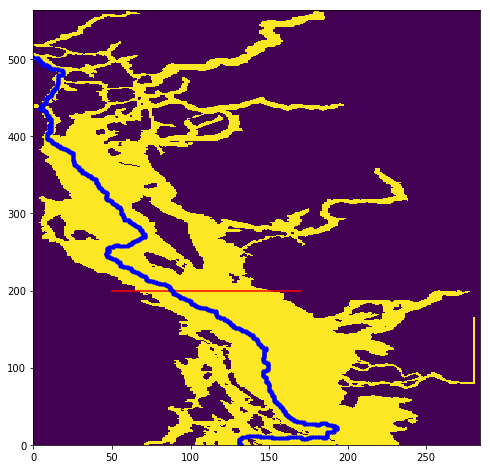

In [59]:
fig, ax = plt.subplots(figsize = (8,8))
ax.pcolormesh(new_domain[0,...])
ax.plot((50,170), (200,200), 'r-')
for point in thalweg_points:
    ax.plot(point[1], point[0], 'b.')

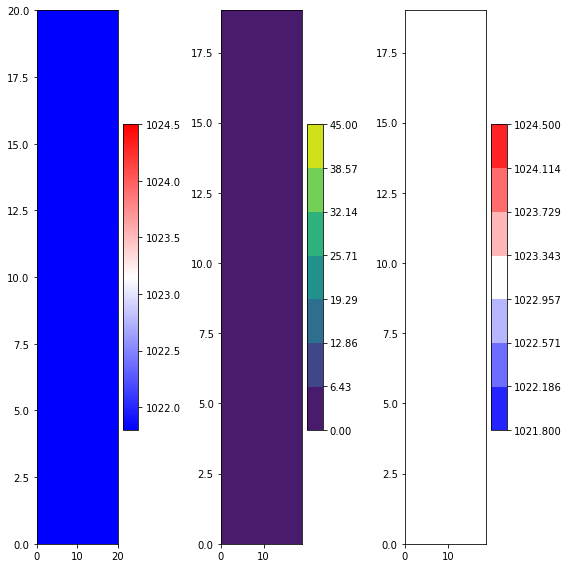

In [68]:
fig, ax = plt.subplots(1,3,figsize = (8,8))
den = ax[0].pcolormesh(np.ones((20,20)), 
                      vmin = 1021.8, vmax =1024.5, cmap = 'bwr')
fig.colorbar(den, ax=ax[0])
den1 = ax[1].contourf(np.ones((20,20)), levels = np.linspace(0, 45, 8))
fig.colorbar(den1, ax=ax[1])
den2 = ax[2].contourf(np.ones((20,20)), levels = np.linspace(1021.8, 1024.5, 8), cmap = 'bwr')
fig.colorbar(den2, ax=ax[2])
plt.tight_layout()

In [5]:
U24W = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/24UW/SalishSea_1h_20170101_20170105_grid_T.nc')
U24S = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/24US/SalishSea_1h_20160601_20160605_grid_T.nc')

### Wind Event
* Pre winds: 6 hours
* Ramp up: 24 hours
* Steady: 24 hours
* Ramp down: 24 hours
* Post winds: 24 hours

## vtau = 0.2, winter stratification on the left, summer stratification on the right 

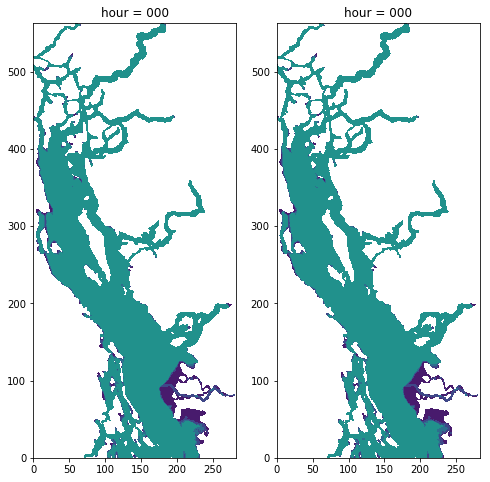

In [47]:
animate_one_density(U24W, U24S, 1023.3)

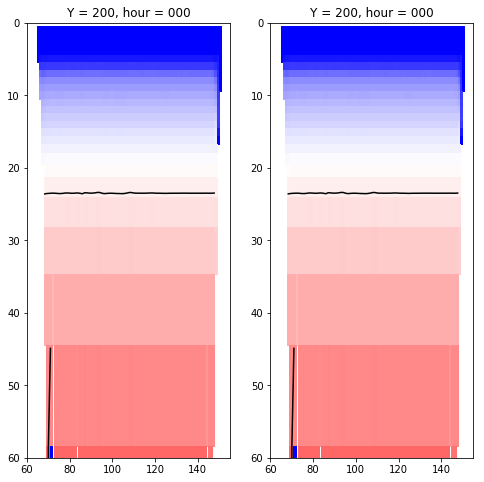

In [53]:
animatecrosssection(U24W, U24S, 200, [60,155], [60,0], new_domain)

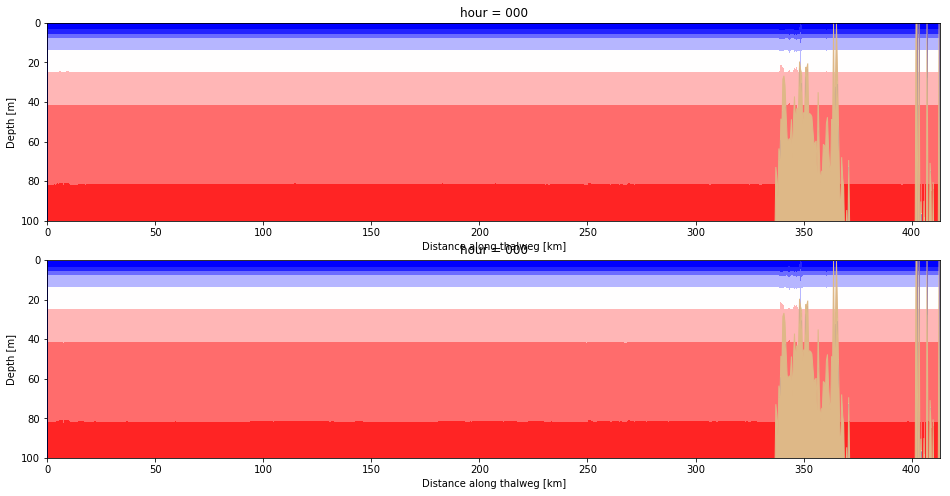

In [64]:
animate_thalweg(U24W, U24S, [100,0])

In [26]:
U48W = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/48UW/SalishSea_1h_20170101_20170105_grid_T.nc')
U48S = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/48US/SalishSea_1h_20160601_20160605_grid_T.nc')

### Wind Event

* Pre winds: 6 hours
* Ramp up: 12 hours
* Steady: 48 hours
* Ramp down: 12 hours
* Post winds: 24 hours

## vtau = 0.2, winter stratification on the left, summer stratification on the right

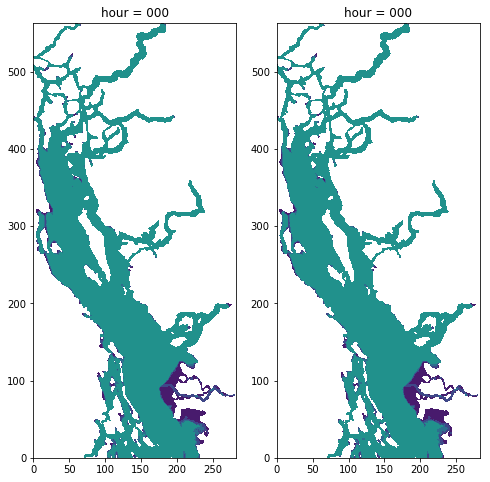

In [46]:
animate_one_density(U48W, U48S, 1023.3)

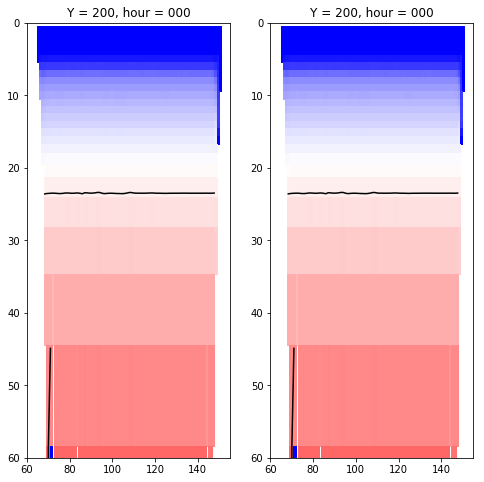

In [54]:
animatecrosssection(U48W, U48S, 200, [60,155], [60,0], new_domain)

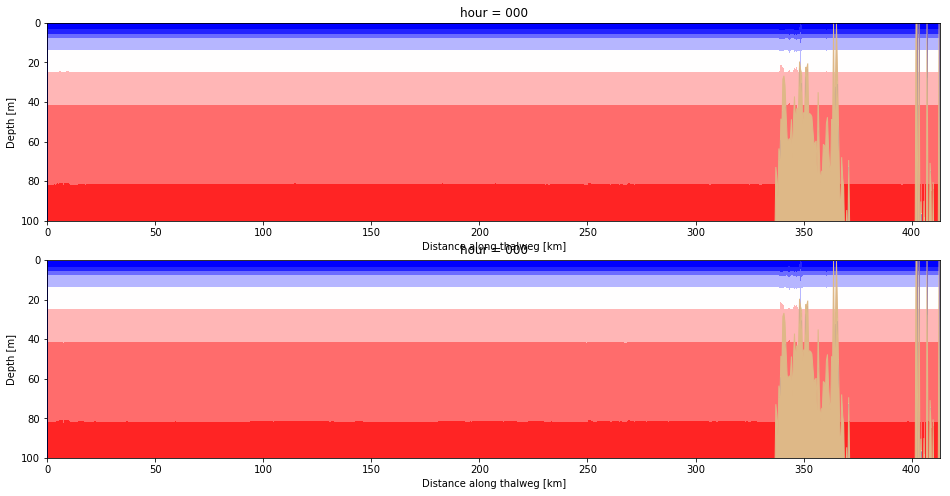

In [65]:
animate_thalweg(U48W, U48S, [100,0])

In [29]:
U72W = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/72UW/SalishSea_1h_20170101_20170105_grid_T.nc')
U72S = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/SalishSeaLake/72US/SalishSea_1h_20160601_20160605_grid_T.nc')

### Wind Event

* Pre winds: 6 hours
* Ramp up: 1 timestep (40sec)
* Steady: 72 hours
* Ramp down: 1 timestep (40sec)
* Post winds: 24 hours

## vtau = 0.2, winter stratification on the left, summer stratification on the right

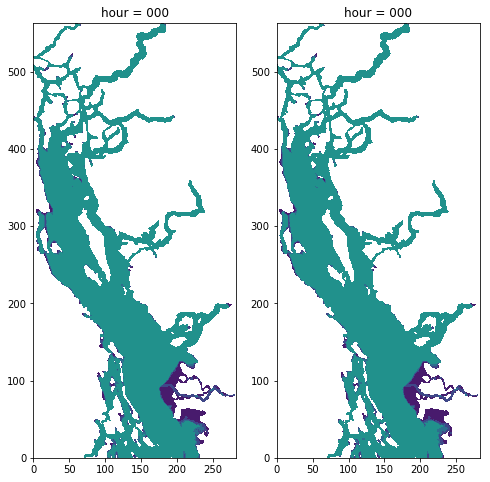

In [45]:
animate_one_density(U72W, U72S, 1023.3)

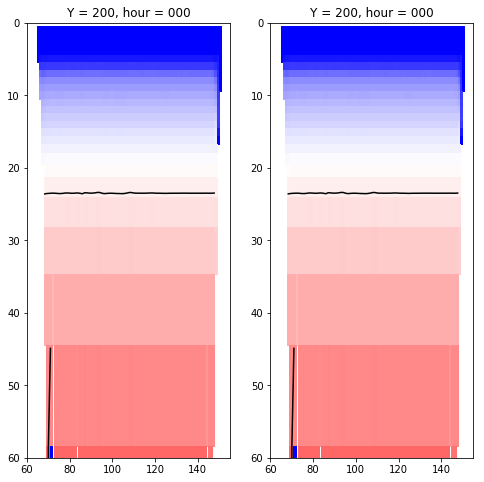

In [55]:
animatecrosssection(U72W, U72S, 200, [60,155], [60,0], new_domain)

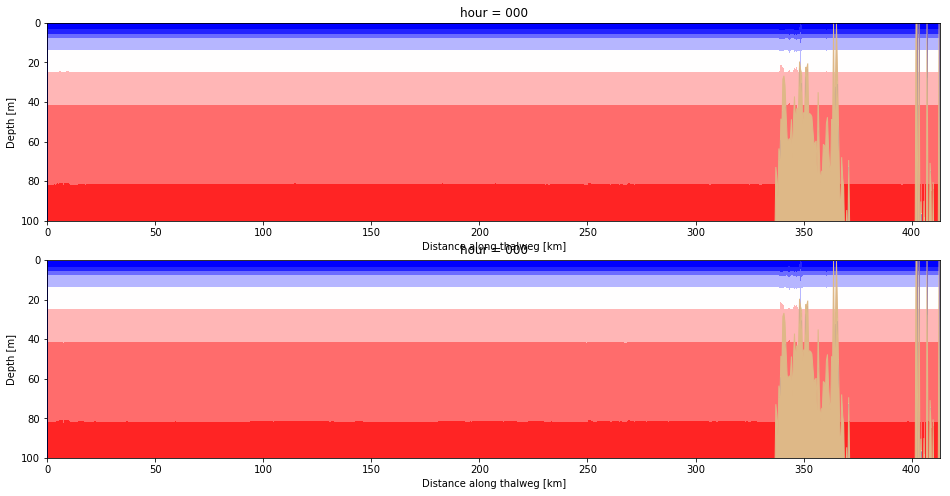

In [66]:
animate_thalweg(U72W, U72S, [100,0])